<a href="https://colab.research.google.com/github/nvancha/DS_Hackathon-/blob/main/GROUP_4_M5_Hackathon_Wind_speed_prediction_Production.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**BLUF**
#*GROUP - 4*
#*Nipuna Vancha*
#*Amina Seini*
The business problem in this context is to develop an accurate wind speed prediction model for The Weather Channel DC.

Before going on with regression we determined if sclaing is required and based on Shape of X and y (6574, 10) (6574,)
Shape of training set X and y (5259, 10) (5259,)
Shape of test set X and y (1315, 10) (1315,)
the shapes of X_train and X_test, it seems that there are no significant differences in the scale of the predictors Therefore no scaling is required.

Here after doing a regressor development we concluded that the 3 best classifiers are:

1. LightGBM:
Mean (std Dev) of MSE: 16.744 (0.973)

2. XGBoost:
Mean (std Dev) of MSE: 16.938 (1.007)

3. Random Forest:
Mean (std Dev) of MSE: 17.377 (1.028)

We compared all the 3 regressions by doing a learning curve (with closest training and cross-validation score) and decuced that LightGBM is the best regression model to solve our business problem.

Although XGBoost has highest AUC of 0.9499, we decided to go with the accuracy of learning curve and finlaized that LightGBM is the best regression model.

Ran gridsearch for LightGBM the best Parameters are:

{'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 200}

Best Score is 0.282956990969513

From the learning curve we can see that there is no overfitting (y-axis value us under 1.0 and the lines are converging)


The leaderboard:

|**Classifier** |    AUC    |
|:----------------------|:------------:|
|Best "Code" Classifier #1 LightGBM  (Lowest MSE=0.973) | 0.9480 |
|#2 XGBoost (MSE=1.007) | 0.9499 |
|#3 Random Forest (MSE=1.028)| 0.9343 |


#**Business Problem**

![image_wind](https://s.w-x.co/240x180_twc_default.png)


**Context**

The Weather Channel DC is your client and has requested you to help them build an accurate wind speed prediction model.

High precision and reliable wind speed forecasting is a challenge for meteorologists. Severe wind due to convective storms, causes considerable damages (large scale forest damage, outage, buildings/houses damage, etc.). Convective events such as thunderstorms, tornadoes as well as large hail, strong winds, are natural hazards that have the potential to disrupt daily life, especially over complex terrain favoring the initiation of convection. Even ordinary convective events produce severe winds which causes fatal and costly damages. Therefore, wind speed prediction is an important task to get advanced severe weather warning. This dataset contains the responses of a weather sensor that collected different weather variables such as temperatures and precipitation.

**Content**

The dataset contains 6574 instances of daily averaged responses from an array of 5 weather variables sensors embedded in a meteorological station. The device was located on the field in a significantly empty area, at 21M. Data were recorded from January 1961 to December 1978 (17 years). Ground Truth daily averaged precipitations, maximum and minimum temperatures, and grass minimum temperature were provided.



#**Hackathon Checklist**


For the M5 hackathon, using the data described in class, document and compare the performance of:

Develop at least three "code"  regerssors (i.e., using scikit-learn or similar libraries) and gridsearch the best one. You can use either original or Compare it to the best "low-code" (i.e., PyCaret), using/adapting the code provided.

Decide and implement a validation strategy, and decide whether scaling is needed.  Use learning curves to determine if your regressors are overfitted.

#**Libraries**

In [ ]:
# import libraries
!pip install -q pycaret autoviz psynlig
from pycaret.regression import *
from autoviz.AutoViz_Class import AutoViz_Class

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.4/67.4 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 2.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

Imported v0.1.601. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [ ]:
# PCA
from sklearn.decomposition import PCA
from psynlig import pca_explained_variance_bar

In [ ]:
# Basic libraries
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import unique
from numpy import where
from numpy import mean
from numpy import std
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import pyplot
import scipy.stats as ss
import math

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from numpy import mean
from numpy import absolute
from numpy import loadtxt
from datetime import datetime
import scipy.stats as ss
from scipy.stats.mstats import winsorize

In [ ]:
!pip install --quiet sweetviz     # You may need to pip install sweetviz
import sweetviz as sv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 32.4 MB/s eta 0:00:00


In [ ]:
# Plotly & Jupyter-Dash
!pip install --quiet --upgrade plotly
!pip install --quiet jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 43.6 MB/s eta 0:00:00


In [ ]:
# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn import metrics
from sklearn import linear_model
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, StackingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV

In [ ]:
# Libraries
from sklearn.svm import SVR
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from sklearn.model_selection import ShuffleSplit
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline

from sklearn.utils._testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning

In [ ]:
# XGBoost & LightGBM
from xgboost import XGBRegressor
import lightgbm as lgb

In [ ]:
# Keras
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.metrics import mean_squared_error

In [ ]:
from datetime import datetime

#**Data Dictionary**

Attribute Information:
- **DATE**: (YYYY-MM-DD)
- **WIND**: Average wind speed [knots]
- **IND**: First indicator value
- **RAIN**: Precipitation Amount (mm)
- **IND.1**: Second indicator value
- **T.MAX**: Maximum Temperature (°C)
- **IND.2**: Third indicator value
- **T.MIN**: Minimum Temperature (°C)
- **T.MIN.G**: 09utc Grass Minimum Temperature (°C)

In [ ]:
# Read
# File: https://drive.google.com/file/d/1gM8YqjNhh4tw8PUWqWkykztu7f4r0VCG/view?usp=share_link
url = 'https://drive.google.com/uc?id=1gM8YqjNhh4tw8PUWqWkykztu7f4r0VCG'

# Read in the dataset
df = pd.read_csv(url)

In [ ]:
# Head of df
df.head(5)

,DATE,WIND,IND,RAIN,IND.1,T.MAX,IND.2,T.MIN,T.MIN.G
0,1961-01-01,13.67,0,0.2,0.0,9.5,0.0,3.7,-1.0
1,1961-01-02,11.50,0,5.1,0.0,7.2,0.0,4.2,1.1
2,1961-01-03,11.25,0,0.4,0.0,5.5,0.0,0.5,-0.5
3,1961-01-04,8.63,0,0.2,0.0,5.6,0.0,0.4,-3.2
4,1961-01-05,11.92,0,10.4,0.0,7.2,1.0,-1.5,-7.5


#**M2 & M3: EDA & & Data Preprocessing**

In [ ]:
df.columns

Index(['DATE', 'WIND', 'IND', 'RAIN', 'IND.1', 'T.MAX', 'IND.2', 'T.MIN',
       'T.MIN.G'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6574 entries, 0 to 6573
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   DATE     6574 non-null   object 
 1   WIND     6574 non-null   float64
 2   IND      6574 non-null   int64  
 3   RAIN     6574 non-null   float64
 4   IND.1    6513 non-null   float64
 5   T.MAX    5953 non-null   float64
 6   IND.2    6513 non-null   float64
 7   T.MIN    5900 non-null   float64
 8   T.MIN.G  6214 non-null   float64
dtypes: float64(7), int64(1), object(1)
memory usage: 462.4+ KB


In [ ]:
# Unique values
df.nunique()

DATE       6574
WIND        580
IND           3
RAIN        226
IND.1         4
T.MAX       246
IND.2         5
T.MIN       247
T.MIN.G     283
dtype: int64

##*NaNs, Dups, etc*

In [ ]:
# Drop IND.1 since it has only one value
df = df.drop('IND.1', axis=1)

In [ ]:
# Shape
print(df.shape)
# Head
print(df.head())
# Info
print(df.info())
# Check for missing values
print('\n\nMissing Values\n',df.isnull().sum(axis=0))
# Check for duplicates
print('\n Duplicates\n',df.duplicated().sum())

(6574, 8)
         DATE   WIND  IND  RAIN  T.MAX  IND.2  T.MIN  T.MIN.G
0  1961-01-01  13.67    0   0.2    9.5    0.0    3.7     -1.0
1  1961-01-02  11.50    0   5.1    7.2    0.0    4.2      1.1
2  1961-01-03  11.25    0   0.4    5.5    0.0    0.5     -0.5
3  1961-01-04   8.63    0   0.2    5.6    0.0    0.4     -3.2
4  1961-01-05  11.92    0  10.4    7.2    1.0   -1.5     -7.5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6574 entries, 0 to 6573
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   DATE     6574 non-null   object 
 1   WIND     6574 non-null   float64
 2   IND      6574 non-null   int64  
 3   RAIN     6574 non-null   float64
 4   T.MAX    5953 non-null   float64
 5   IND.2    6513 non-null   float64
 6   T.MIN    5900 non-null   float64
 7   T.MIN.G  6214 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 411.0+ KB
None


Missing Values
 DATE         0
WIND         0
IND          0


In [ ]:
missing = df.isnull()

# create a heatmap of missing values
sns.heatmap(missing, cmap='viridis')
plt.show()

In [ ]:
# Drop NaNs
df = df.dropna()
df.isna().sum()

DATE       0
WIND       0
IND        0
RAIN       0
T.MAX      0
IND.2      0
T.MIN      0
T.MIN.G    0
dtype: int64

##*Date Processing*

In [ ]:
# Extract year, month and day from date feature
df['Year'] = pd.DatetimeIndex(df['DATE']).year
df['Month'] = pd.DatetimeIndex(df['DATE']).month


def ymd_to_timestamp(value):
    if isinstance(value, str):
        x = (datetime.strptime(value, '%Y-%m-%d').timestamp() /  1000000) + 300
    else:
        x = value
    return x

# apply the function to the date column using the 'apply' method
df['DATE'] = df['DATE'].apply(lambda x: ymd_to_timestamp(x))
df.head()

,DATE,WIND,IND,RAIN,T.MAX,IND.2,T.MIN,T.MIN.G,Year,Month
0,16.0032,13.67,0,0.2,9.5,0.0,3.7,-1.0,1961,1
1,16.0896,11.50,0,5.1,7.2,0.0,4.2,1.1,1961,1
2,16.1760,11.25,0,0.4,5.5,0.0,0.5,-0.5,1961,1
3,16.2624,8.63,0,0.2,5.6,0.0,0.4,-3.2,1961,1
4,16.3488,11.92,0,10.4,7.2,1.0,-1.5,-7.5,1961,1


In [ ]:
##*Descriptive Statistics*
df.describe()

,DATE,WIND,IND,RAIN,T.MAX,IND.2,T.MIN,T.MIN.G,Year,Month
count,5638.000000,5638.000000,5638.000000,5638.000000,5638.000000,5638.000000,5638.000000,5638.000000,5638.000000,5638.000000
mean,319.618164,9.682297,0.399610,1.875647,13.285669,0.093828,6.446949,2.757627,1970.126641,6.484569
std,164.032699,4.938009,1.189562,3.973763,4.890483,0.303538,4.626693,5.576713,5.184302,3.417550
min,16.003200,0.000000,0.000000,0.000000,-0.100000,0.000000,-11.500000,-13.500000,1961.000000,1.000000
25%,197.896800,5.910000,0.000000,0.000000,9.600000,0.000000,3.100000,-1.000000,1966.000000,4.000000
50%,335.294400,9.080000,0.000000,0.200000,13.100000,0.000000,6.500000,3.000000,1971.000000,6.000000
75%,459.559200,12.830000,0.000000,2.000000,17.200000,0.000000,10.000000,7.000000,1975.000000,9.000000
max,583.910400,30.370000,4.000000,67.000000,26.800000,3.000000,18.000000,15.800000,1978.000000,12.000000


##Distinguish Categoricals and Quants

In [ ]:
df.columns

Index(['DATE', 'WIND', 'IND', 'RAIN', 'IND.1', 'T.MAX', 'IND.2', 'T.MIN',
       'T.MIN.G'],
      dtype='object')

In [ ]:
#Distinguish categoricals and quants
quant_features = ['DATE','RAIN','T.MAX', 'T.MIN','T.MIN.G', 'Year', 'Month']
categoricals = ['IND','IND.2']
target = ['WIND']

##*Correlation Heatmap*

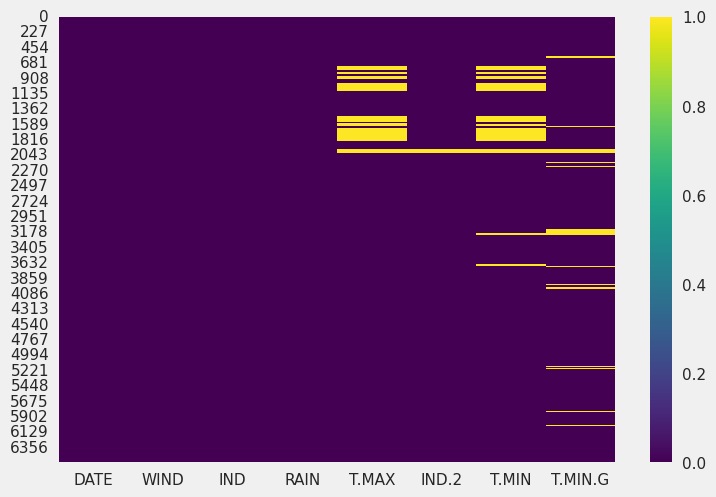

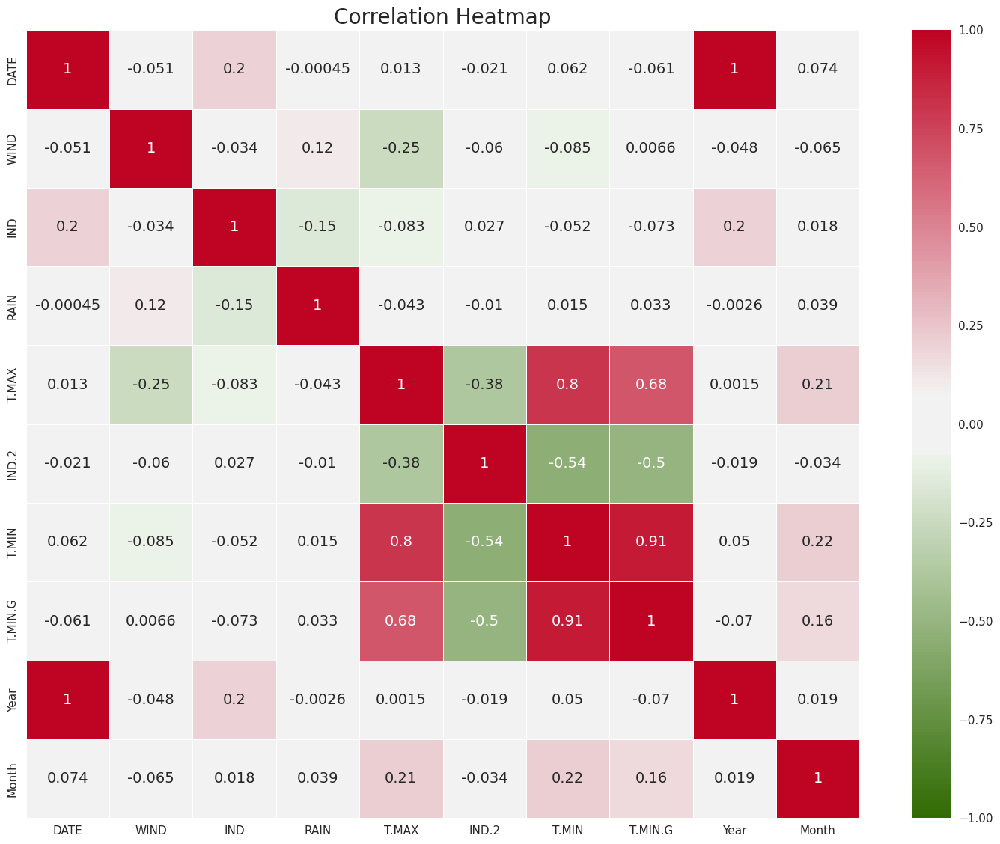

In [ ]:
# Correlation matrix to get a sense of predictor quality
%matplotlib inline
sns.set_style('darkgrid')
plt.figure(figsize = (16,13))
cmap = sns.diverging_palette(120, 10, l = 40, s = 99, sep = 20, center = 'light', as_cmap = True)
sns.heatmap((df).corr(), vmin = -1, vmax = 1, annot = True, cmap = cmap, lw = .5, linecolor = 'white')
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Power Consumption by different features
fig1 = px.scatter(df, x = "DATE", y = "WIND", color = "IND", trendline="lowess")
fig1.show ()

fig2 = px.scatter(df, x = "DATE", y = "WIND", color = "RAIN", trendline="lowess")
fig2.show ()

##*Skewness*

In [ ]:
#Skewness of target
from scipy.stats import skew

# Log-transform columns with skewness > 1
if skew(df[target]) > 1:
    df[target] = np.log1p(df[target])
    print("Took the log of the target + 1 (i.e., log1p(df[target])")


In [ ]:
#Check skewness of each feature
print('Skewness\n', df[quant_features].skew().sort_values(ascending=False))

Skewness
 RAIN       4.328147
Month      0.029259
T.MAX     -0.007187
T.MIN     -0.190367
T.MIN.G   -0.192264
DATE      -0.216804
Year      -0.216811
dtype: float64


In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Sat Feb 23 14:42:46 2019
@author: DATAmadness
"""

##################################################
# A function that will accept a pandas dataframe
# and auto-transforms columns that exceeds threshold value
#  -  Offers choice between boxcox or log / exponential transformation
#  -  Automatically handles negative values
#  -  Auto recognizes positive /negative skewness

# Further documentation available here:
# https://datamadness.github.io/Skewness_Auto_Transform




import seaborn as sns
import numpy as np
import math
import scipy.stats as ss
import matplotlib.pyplot as plt

def skew_autotransform(DF, include = None, exclude = None, plot = False, threshold = 1, exp = False):

    #Get list of column names that should be processed based on input parameters
    if include is None and exclude is None:
        colnames = DF.columns.values
    elif include is not None:
        colnames = include
    elif exclude is not None:
        colnames = [item for item in list(DF.columns.values) if item not in exclude]
    else:
        print('No columns to process!')

    #Helper function that checks if all values are positive
    def make_positive(series):
        minimum = np.amin(series)
        #If minimum is negative, offset all values by a constant to move all values to positive teritory
        if minimum <= 0:
            series = series + abs(minimum) + 0.01
        return series


    #Go throug desired columns in DataFrame
    for col in colnames:
        #Get column skewness
        skew = DF[col].skew()
        transformed = True

        if plot:
            #Prep the plot of original data
            sns.set_style("darkgrid")
            sns.set_palette("Blues_r")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            ax1 = sns.distplot(DF[col], ax=axes[0])
            ax1.set(xlabel='Original ' + col)

        #If skewness is larger than threshold and positively skewed; If yes, apply appropriate transformation
        if abs(skew) > threshold and skew > 0:
            skewType = 'positive'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])

            if exp:
               #Apply log transformation
               DF[col] = DF[col].apply(math.log)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()

        elif abs(skew) > threshold and skew < 0:
            skewType = 'negative'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])

            if exp:
               #Apply exp transformation
               DF[col] = DF[col].pow(10)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()

        else:
            #Flag if no transformation was performed
            transformed = False
            skew_new = skew

        #Compare before and after if plot is True
        if plot:
            print('\n ------------------------------------------------------')
            if transformed:
                print('\n %r had %r skewness of %2.2f' %(col, skewType, skew))
                print('\n Transformation yielded skewness of %2.2f' %(skew_new))
                sns.set_palette("Paired")
                ax2 = sns.distplot(DF[col], ax=axes[1], color = 'r')
                ax2.set(xlabel='Transformed ' + col)
                plt.show()
            else:
                print('\n NO TRANSFORMATION APPLIED FOR %r . Skewness = %2.2f' %(col, skew))
                ax2 = sns.distplot(DF[col], ax=axes[1])
                ax2.set(xlabel='NO TRANSFORM ' + col)
                plt.show()


    return DF



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'DATE' . Skewness = -0.22


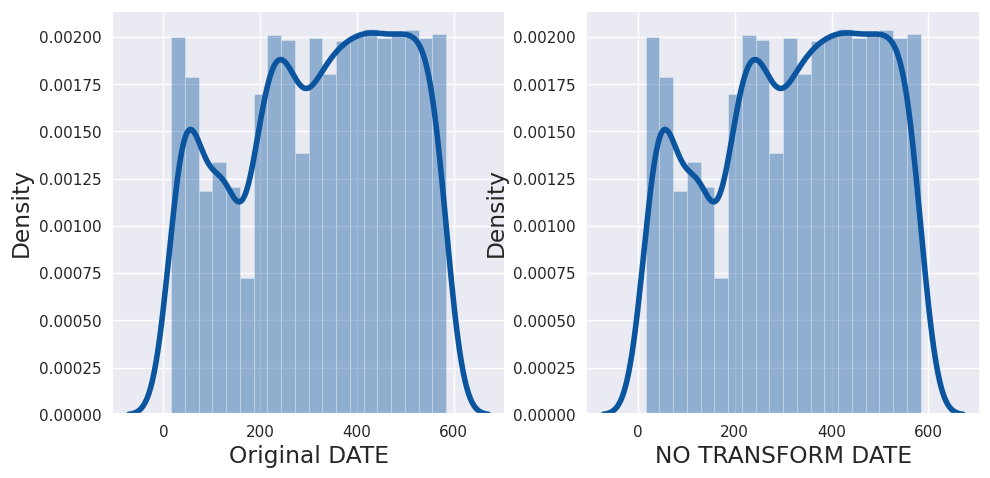


 ------------------------------------------------------

 'RAIN' had 'positive' skewness of 4.33

 Transformation yielded skewness of 0.09


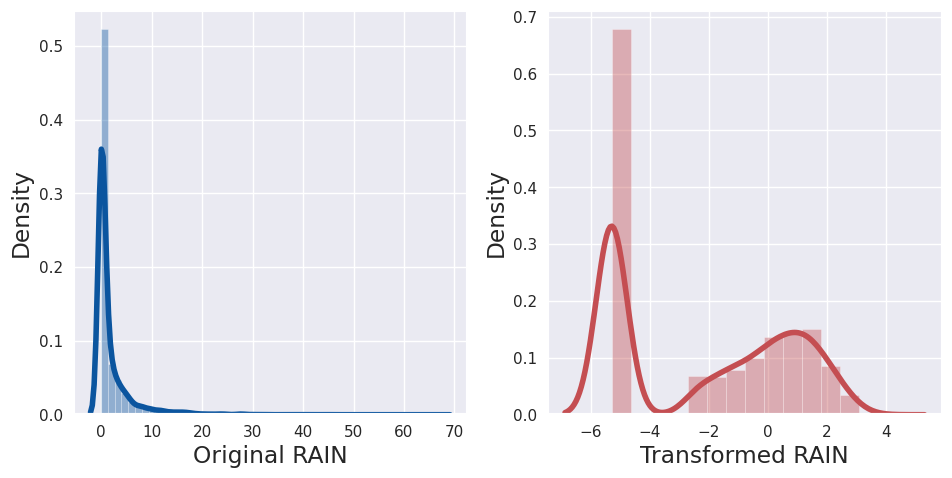


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'T.MAX' . Skewness = -0.01


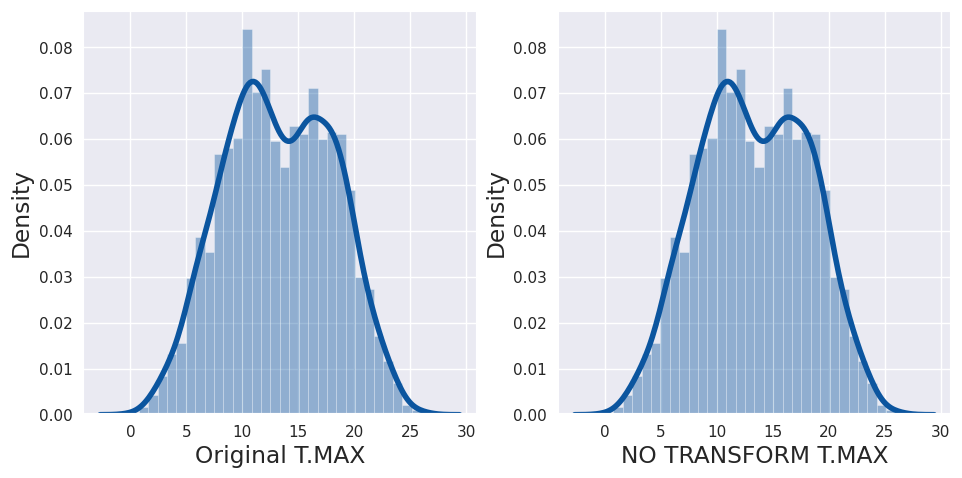


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'T.MIN' . Skewness = -0.19


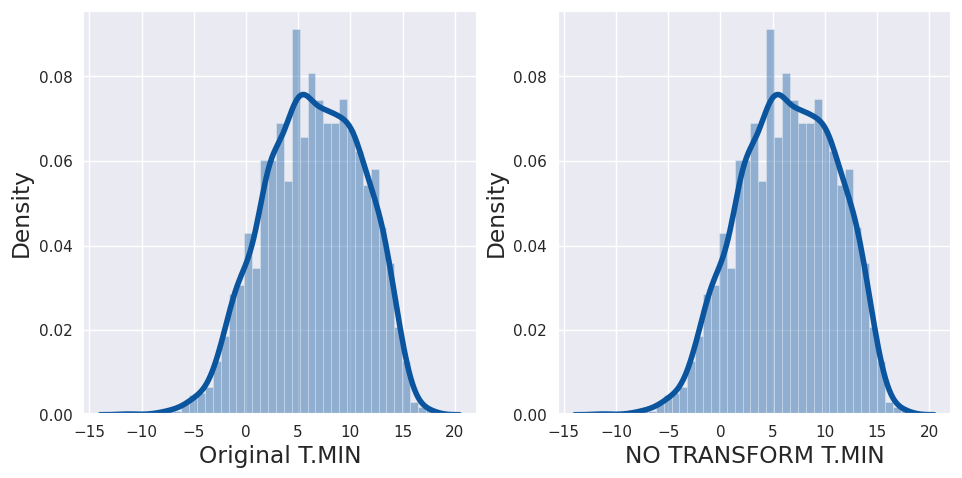


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'T.MIN.G' . Skewness = -0.19


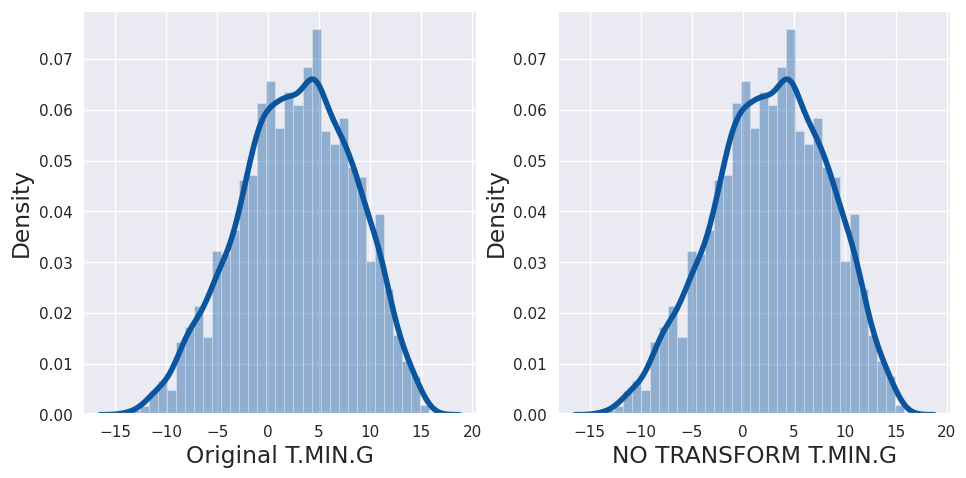


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'Year' . Skewness = -0.22


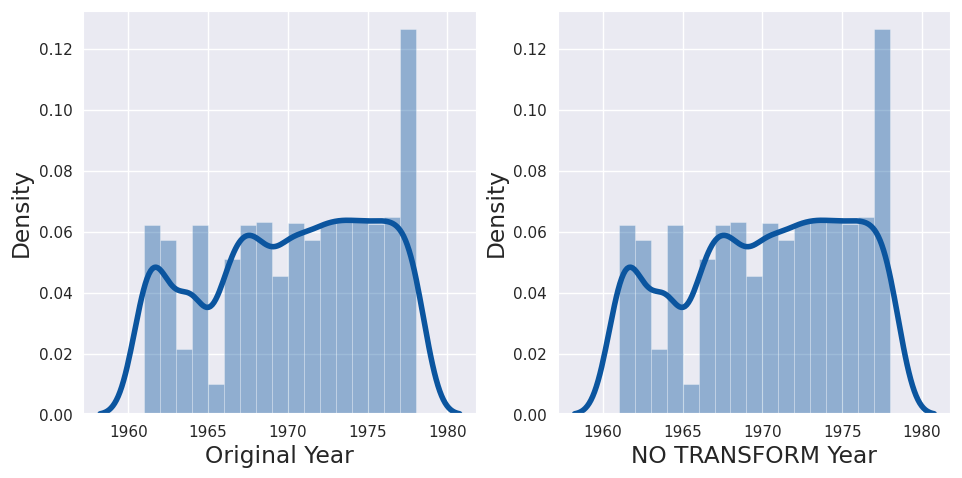


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'Month' . Skewness = 0.03


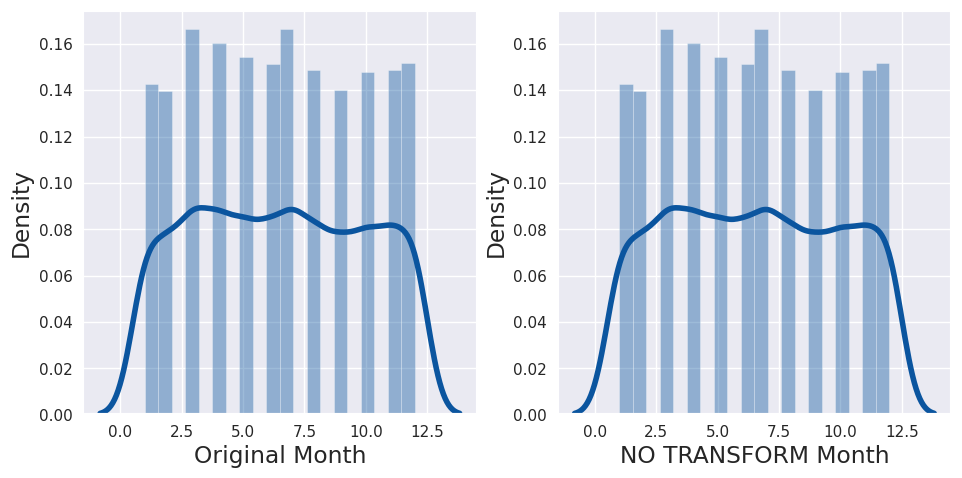

In [ ]:
# Use code above (adapted from https://github.com/datamadness/Automatic-skewness-transformation-for-Pandas-DataFrame) to correct skewness
df= skew_autotransform(df.copy(deep=True), include=quant_features,plot = True, exp = False, threshold = 1)

##*Outliers*

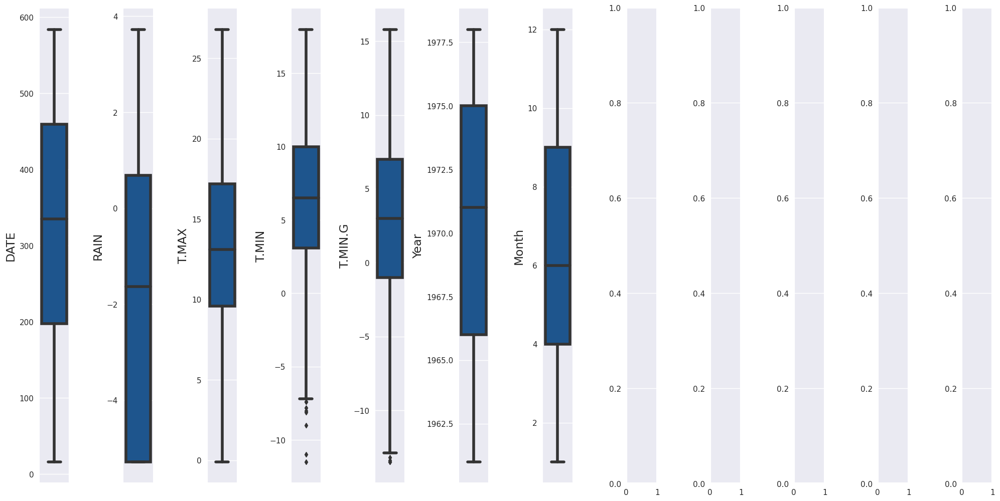

In [ ]:
# Outliers detection

fig, ax = plt.subplots(ncols = 12, nrows = 1, figsize = (20, 10))
index = 0
ax = ax.flatten()

for col, value in df[quant_features].items():
    sns.boxplot(y=col, data=df, ax=ax[index])
    index += 1
plt.tight_layout(pad = 0.5, w_pad=0.7, h_pad=5.0)

In [ ]:
# Tukey Rule outliers
# As an alternative, you could use z-scores greater than 3 or less than -3.

#Tukey's method
def tukey_rule(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_lim = data[col].quantile(0.5) + 2 * IQR
    lower_lim = data[col].quantile(0.5) - 2 * IQR
    outliers = []
    for index, x in enumerate(data[col]):
        if x < lower_lim or x >= upper_lim:
            outliers.append(index)
    return outliers

# Identify outliers
X=df
for i in quant_features:
  outliers_Tukey = tukey_rule(X,i)

# Winsorize X and check the results
X_winsorized = X.copy(deep=True)
for i in quant_features:
  X_winsorized[i] = winsorize(X[i], limits=(0.05, 0.05))

In [ ]:
# Update df
df[quant_features] = X_winsorized[quant_features]

##*Automated Visualizations*

                                             |          | [  0%]   00:00 -> (? left)


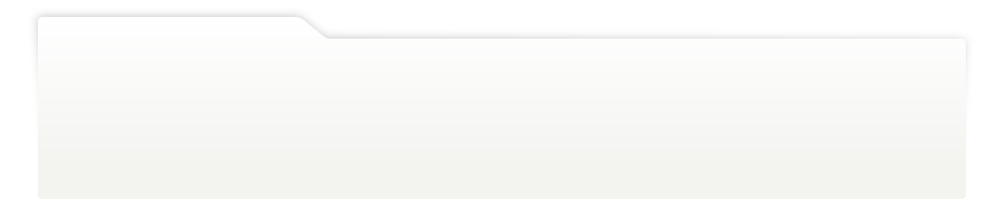
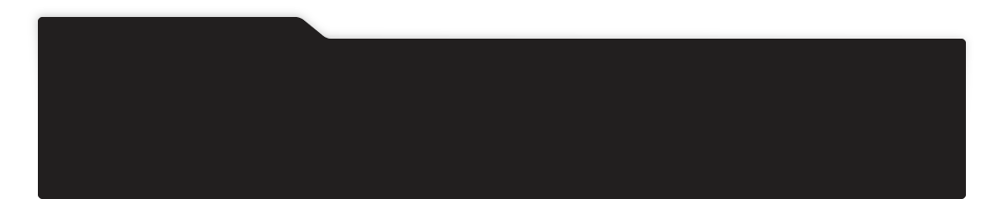
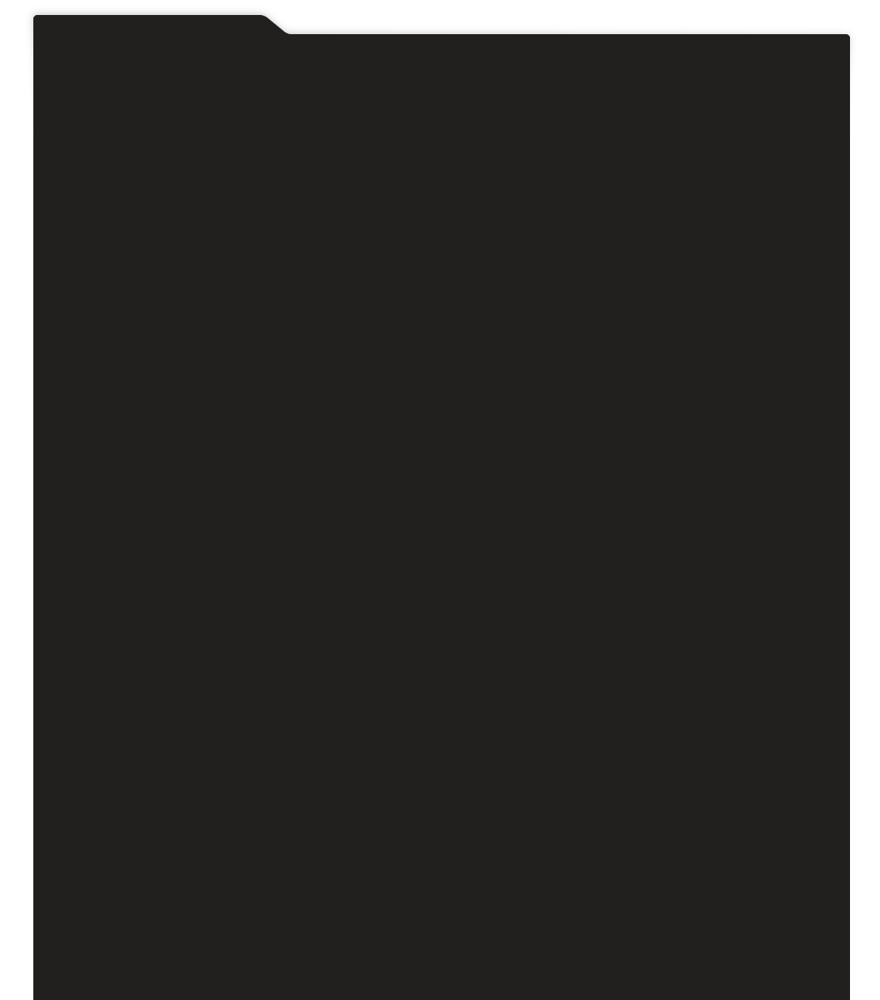
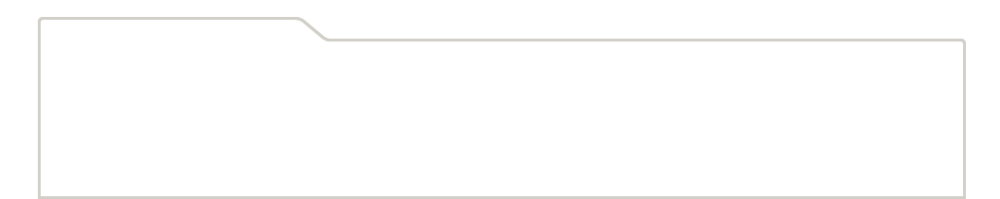
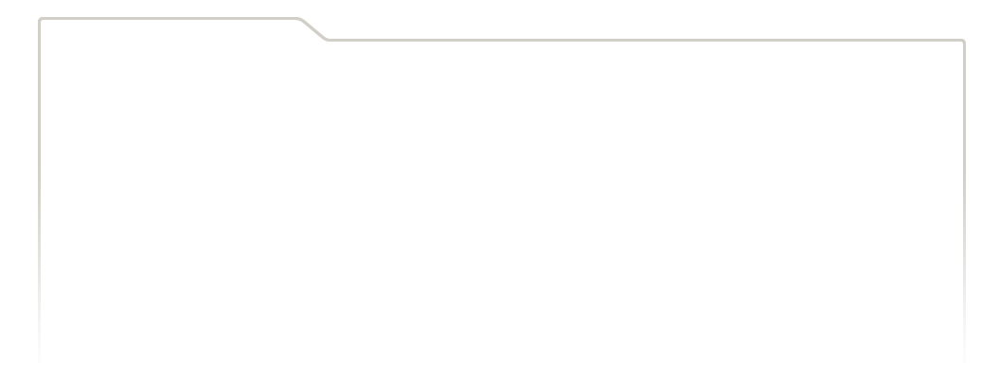
...
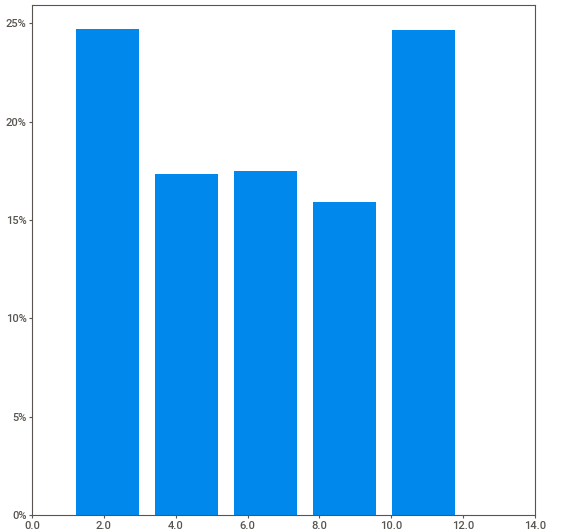
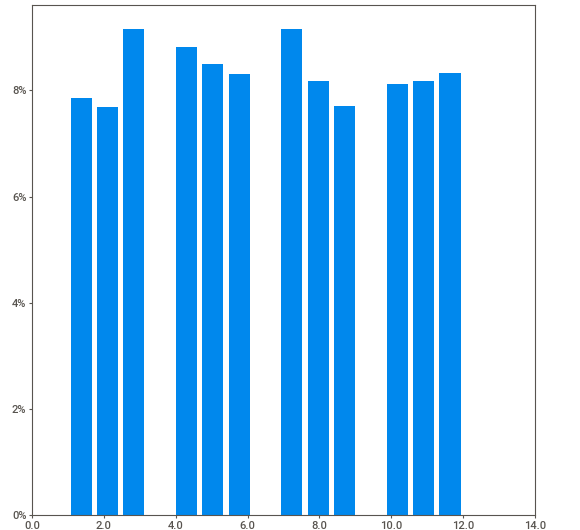
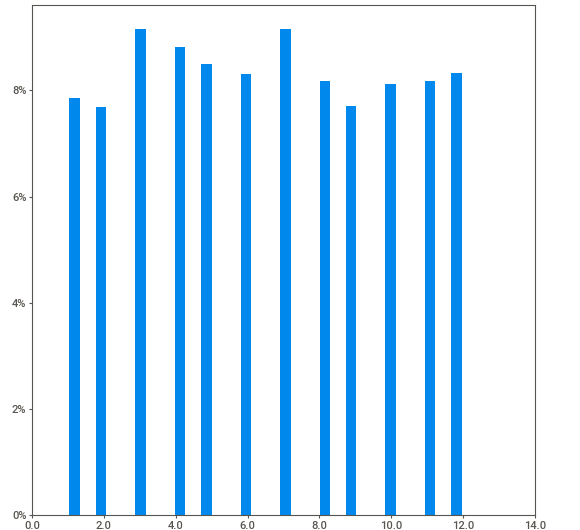
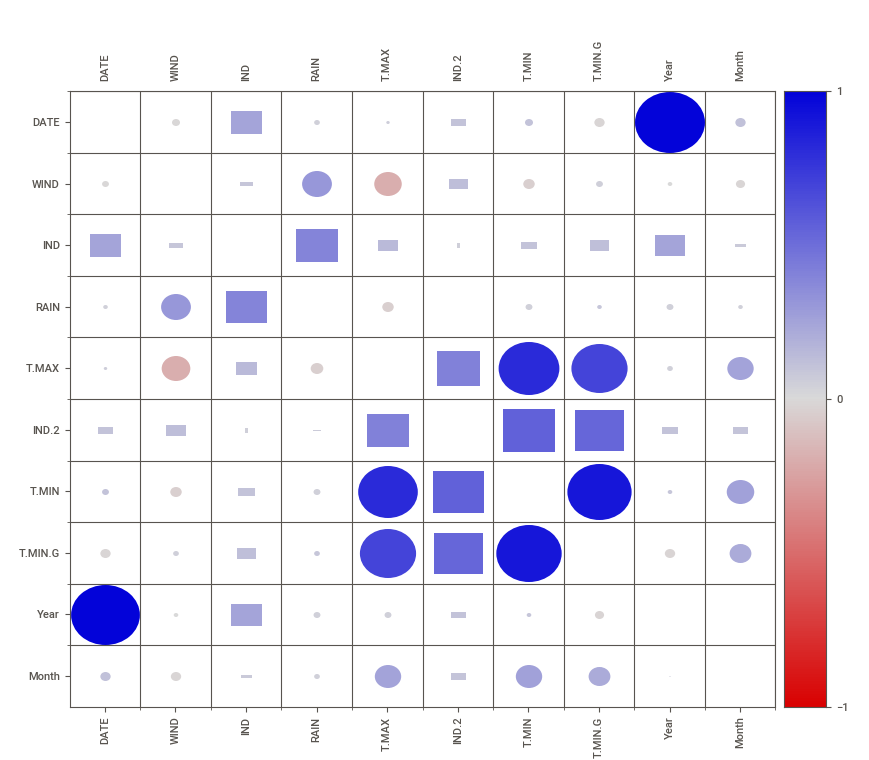
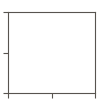

In [ ]:
# Sweetviz as an example of automated visualization

vizreport = sv.analyze(df)
vizreport.show_notebook(layout='widescreen', w=1500, h=300, scale=0.7) #widescreen layout
#vizreport.show_notebook(layout='vertical', w=800, h=300, scale=0.7)   #vertical layout

In [ ]:
# create an AutoViz class
AV = AutoViz_Class()

    Since nrows is smaller than dataset, loading random sample of 2000 rows into pandas...
Shape of your Data Set loaded: (2000, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
DATE,0.000000,89.300000,float64,1786,0,0,
IND,0.000000,0.150000,int64,3,0,0,
RAIN,0.000000,4.600000,float64,92,0,0,
T.MAX,0.000000,7.850000,float64,157,0,0,
IND.2,0.000000,0.200000,float64,4,0,0,right skewed distribution: cap or drop outliers
T.MIN,0.000000,7.500000,float64,150,0,0,
T.MIN.G,0.000000,9.150000,float64,183,0,0,
Year,0.000000,0.900000,int64,18,0,0,
Month,0.000000,0.600000,int64,12,0,0,


    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 2000 exceeds maximum, randomly sampling 2000 rows for EDA...

################ Regression problem #####################


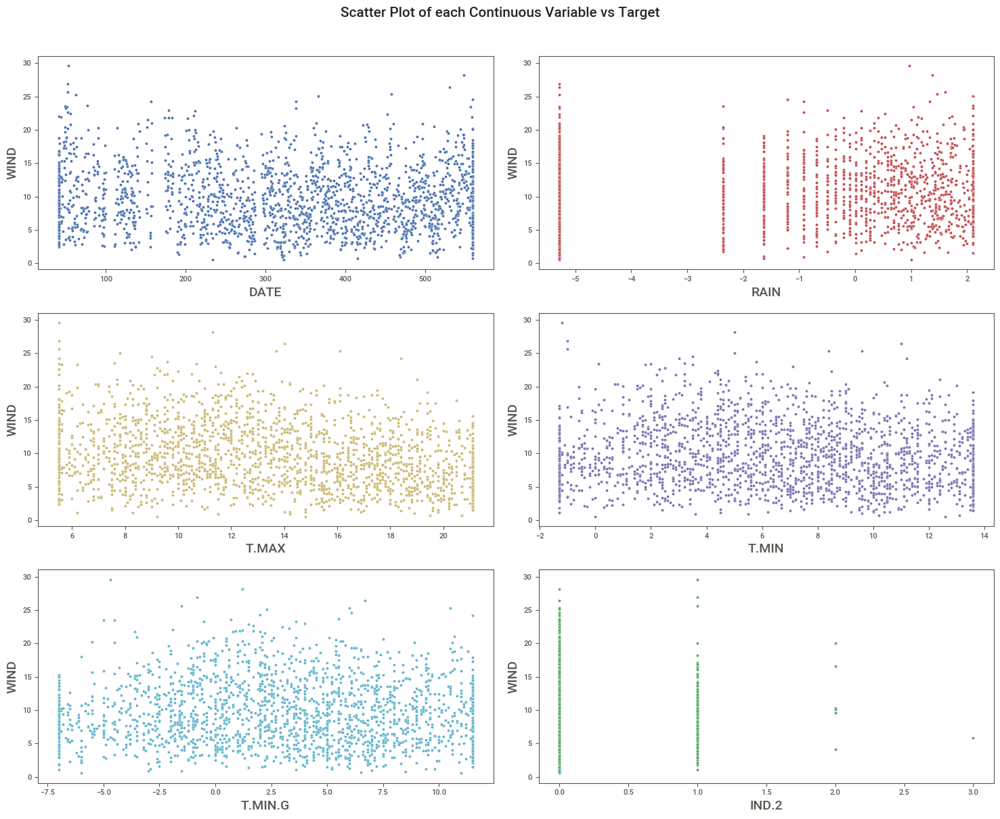

Number of All Scatter Plots = 21


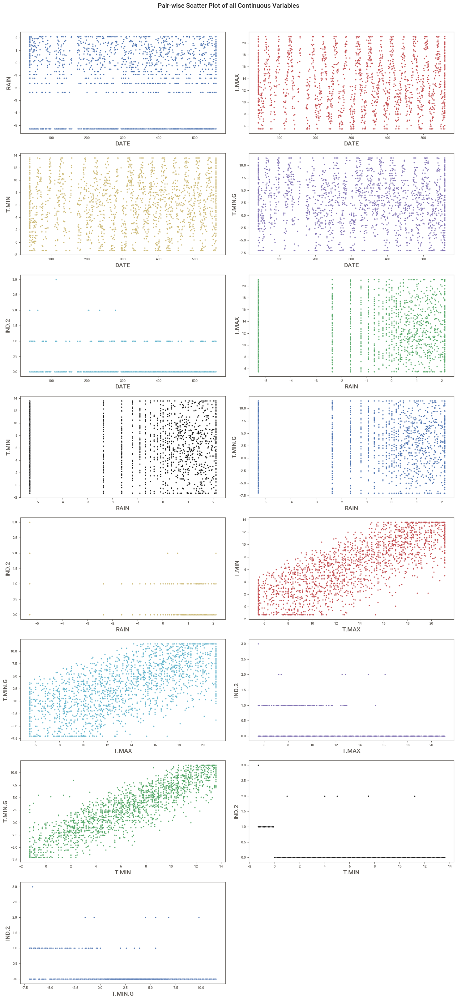

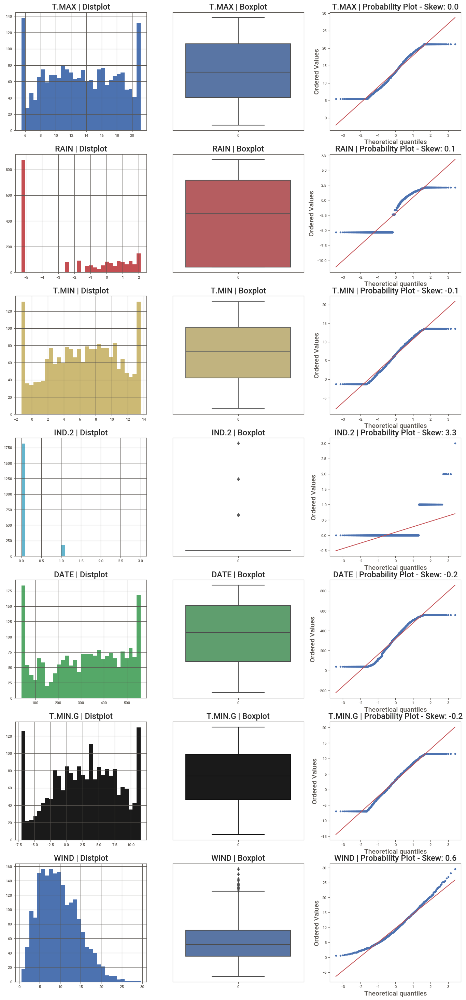

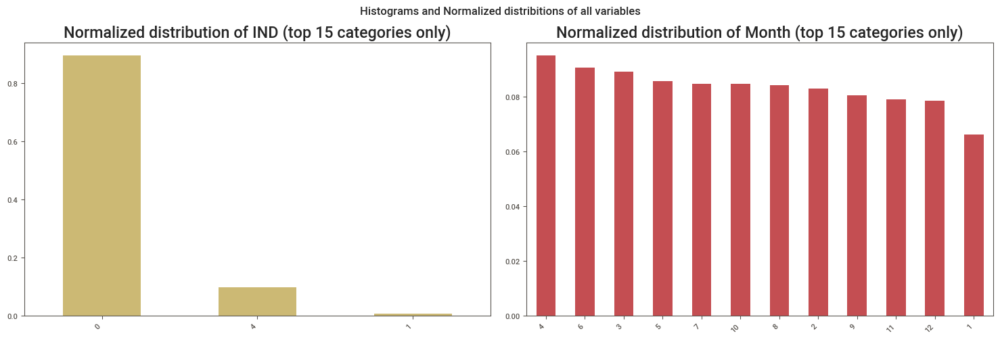

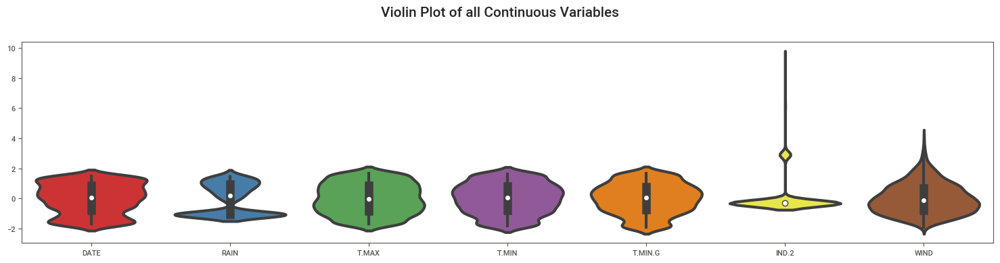

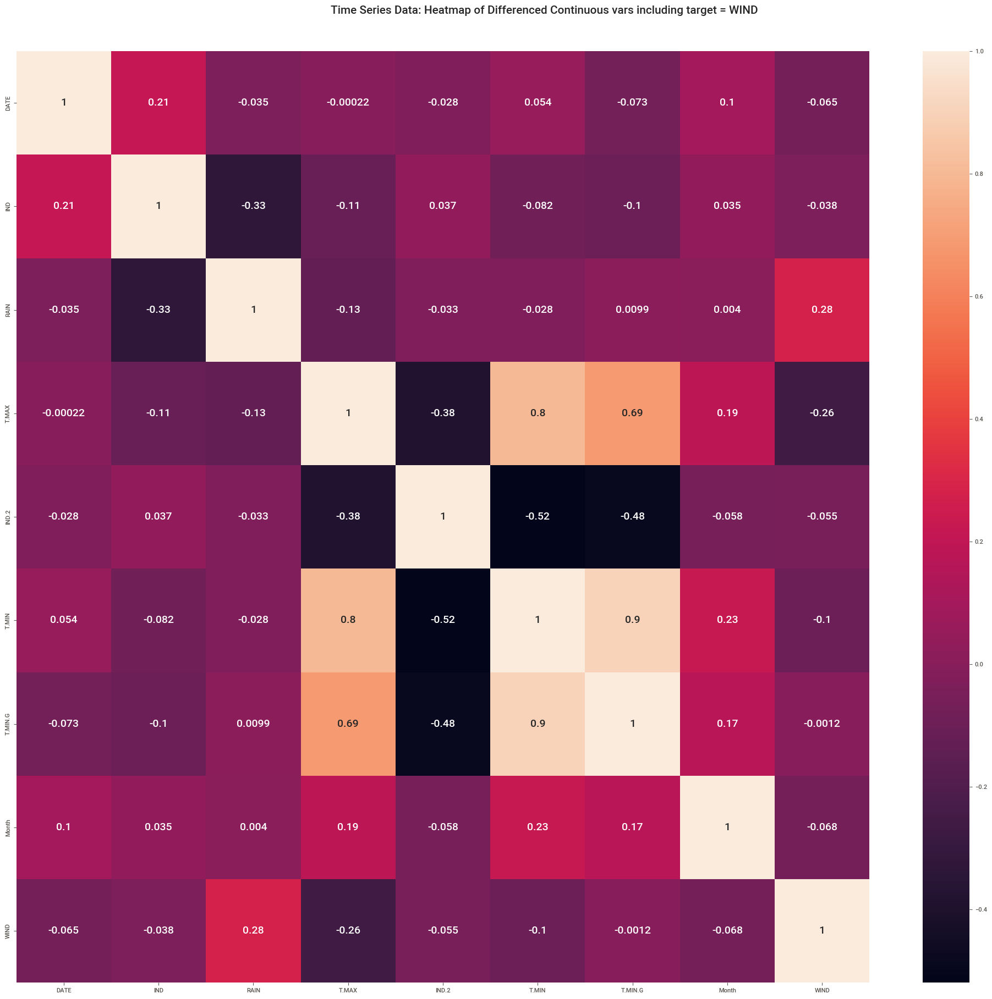

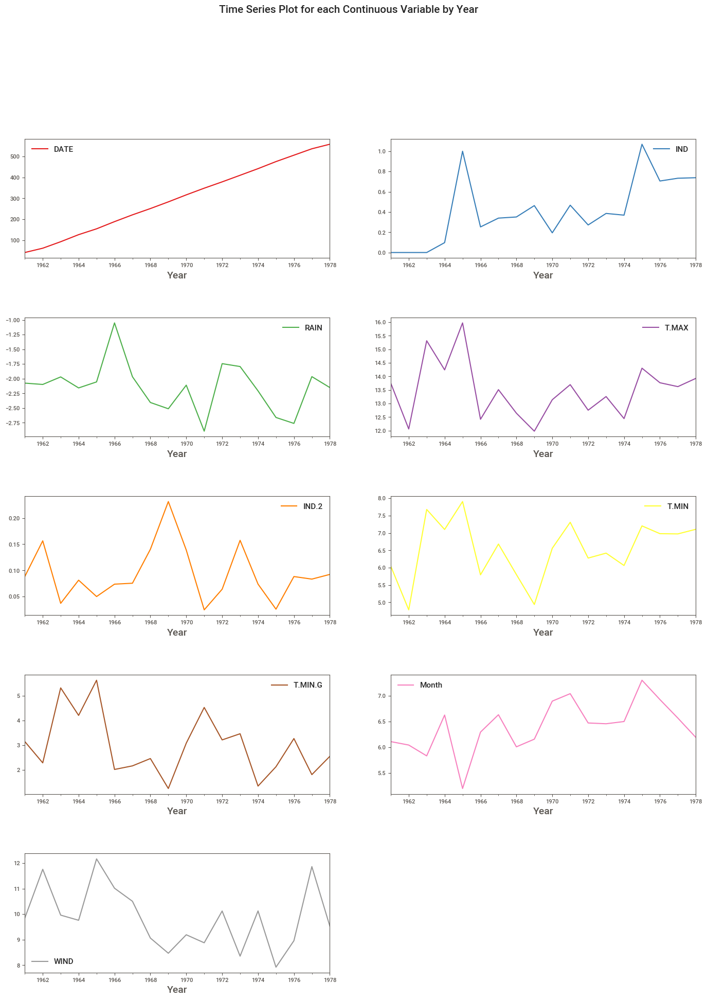

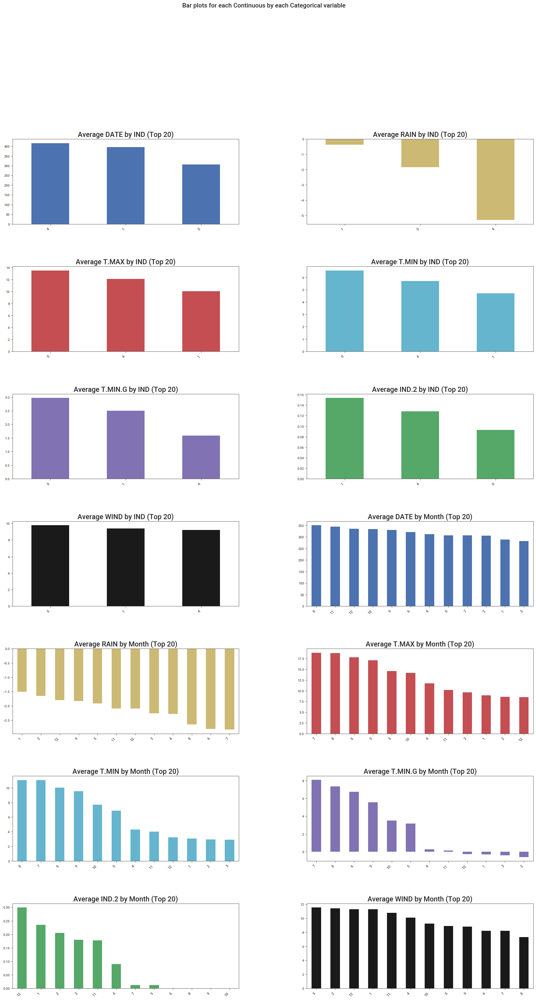

All Plots done
Time to run AutoViz = 23 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# # create charts
%matplotlib inline
dftc = AV.AutoViz(filename='', sep ='' , depVar = 'WIND', dfte = df, header = 0,
verbose = 1, lowess = False, chart_format ='png', max_rows_analyzed = 2000, max_cols_analyzed = 30)

##*Split df to get X and y*

In [ ]:
# Split Predictors & Target
X = pd.DataFrame(df.drop(['WIND'],axis=1))
y = pd.DataFrame(df['WIND'])
print('X:\n',X.head())
print('\ny\n',y.head())

X:
    DATE  IND      RAIN  T.MAX  IND.2  T.MIN  T.MIN.G  Year  Month
0  40.8    0 -1.634301    9.5    0.0    3.7     -1.0  1961      1
1  40.8    0  1.555602    7.2    0.0    4.2      1.1  1961      1
2  40.8    0 -0.915321    5.5    0.0    0.5     -0.5  1961      1
3  40.8    0 -1.634301    5.6    0.0    0.4     -3.2  1961      1
4  40.8    0  2.109919    7.2    1.0   -1.3     -7.0  1961      1

y
     WIND
0  13.67
1  11.50
2  11.25
3   8.63
4  11.92


In [ ]:
# Select predictors for "code" regressors
X=X[['DATE', 'IND', 'RAIN', 'T.MAX', 'IND.2', 'T.MIN',
       'T.MIN.G', 'Year', 'Month']]

##*Holdout Sample & Scaling*

In [ ]:
col_names = X.columns

In [ ]:
# Create holdout sample
# Note: split before doing any trasformations on the data!!!

X_train, X_test, y_train, y_test =\
    train_test_split(X, y,
                     test_size=0.2,    # 80-20 training vs test set split
                     random_state=0)
print('Shape of X and y',X.shape, y.shape, '\nShape of training set X and y',X_train.shape, y_train.shape, '\nShape of test set X and y',X_test.shape, y_test.shape)


Shape of X and y (6574, 10) (6574,) 
Shape of training set X and y (5259, 10) (5259,) 
Shape of test set X and y (1315, 10) (1315,)


In [ ]:
stdsc1 = StandardScaler()
X_tr_std = stdsc1.fit_transform(X)
# X_tst_std = stdsc1.transform(X_tst)
stdsc2 = StandardScaler()
y_tr_std = stdsc2.fit_transform(y.values.reshape(-1, 1))
# y_tst_std = stdsc2.transform(y_tst)￼

##*Scaling*

##*PCA*

Checking: mean of column 0 of X_pca: 8.065756489649948e-17  and its std deviation: 1.0000886957294752


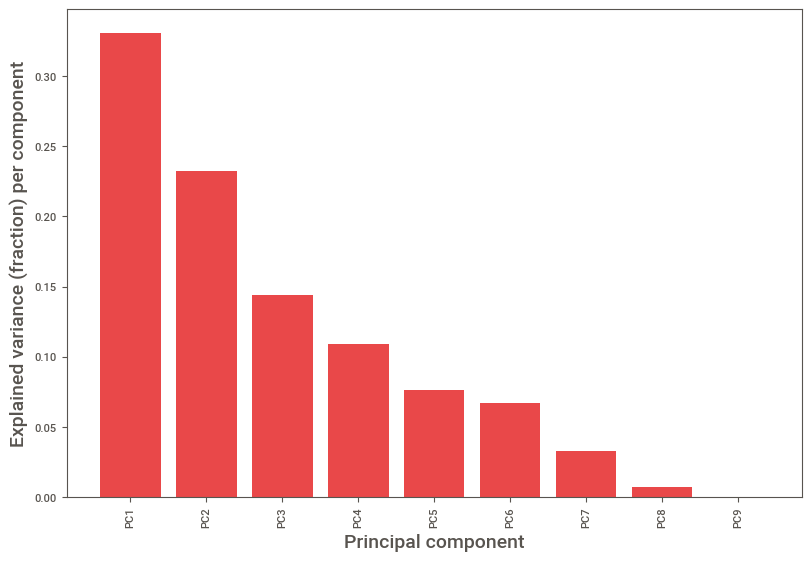

In [ ]:
#Create a PCA object with the desired number of components
pca = PCA(n_components=5)

# Scale predictors
stdsc = StandardScaler()
X_pca = pd.DataFrame(stdsc.fit_transform(X))
print("Checking: mean of column 0 of X_pca:",X_pca[0].mean(), " and its std deviation:", X_pca[0].std())

# Examine the explained variance ratio in order for each components
pca = PCA()
X_pca = pca.fit_transform(X_pca)
pca.explained_variance_ratio_

pca_explained_variance_bar(pca, alpha=0.8)
%matplotlib inline
plt.show()

##*Feature Importance*

<BarContainer object of 9 artists>

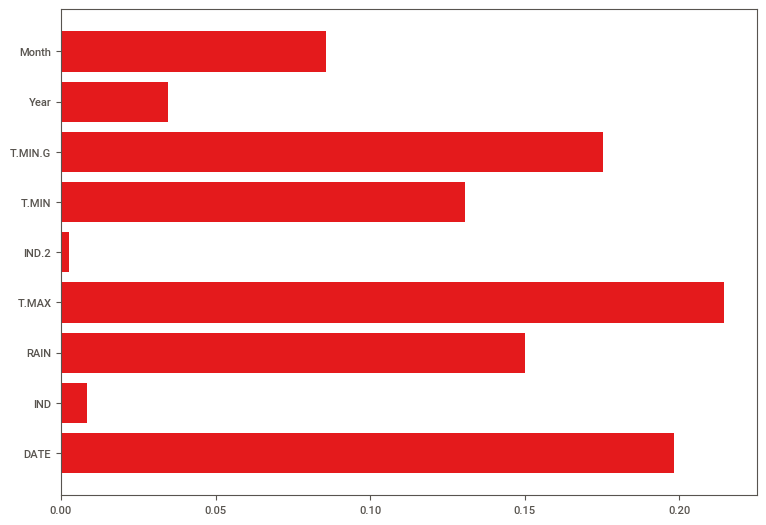

In [ ]:
# Feature Importance
# Code adapted from this source: https://machinelearningmastery.com/calculate-feature-importance-with-python/
# Let's try to weed out the really poor predictors
from matplotlib import pyplot                            # Import pyplot (to be able generate the barchart later in this snippet)
plt.rcParams["figure.figsize"] = (8,6)
model = RandomForestRegressor()                         # Create an instance of a RandomForestClassifier
# fit the model
model.fit(X_tr_std, np.ravel(y_tr_std))                  # Fit the RandomForest instance using the traiing data
# get importance
importance = model.feature_importances_                  # The RandomForestClassifier instance computes feature importance as a bonus. Store them imprtance values in importance'.
# summarize feature importance
plt.barh(col_names, model.feature_importances_)

#**M5 Regression**
The M5 Hackathon begins here! Enjoy!

##*Low-Code PyCaret*

,Description,Value
0,Session id,123
1,Target,WIND
2,Target type,Regression
3,Original data shape,"(5638, 10)"
4,Transformed data shape,"(5638, 2)"
5,Transformed train set shape,"(3946, 2)"
6,Transformed test set shape,"(1692, 2)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,3.3122,17.8025,4.2185,0.2645,0.4368,0.5196,0.5320
et,Extra Trees Regressor,3.2910,18.0868,4.2517,0.2532,0.4311,0.4783,1.2500
rf,Random Forest Regressor,3.3157,18.3460,4.2824,0.2423,0.4324,0.4817,1.3780
lightgbm,Light Gradient Boosting Machine,3.5848,20.4639,4.5224,0.1552,0.4741,0.5910,0.4960
gbr,Gradient Boosting Regressor,3.6218,20.4798,4.5244,0.1548,0.4774,0.6093,1.4640
knn,K Neighbors Regressor,3.5590,20.8024,4.5606,0.1397,0.4655,0.5317,0.1360
dt,Decision Tree Regressor,3.6533,22.5592,4.7478,0.0685,0.4828,0.5028,0.3200
ada,AdaBoost Regressor,4.0341,24.0687,4.9040,0.0075,0.5319,0.7415,1.0860
ridge,Ridge Regression,3.9474,24.2293,4.9209,0.0008,0.5149,0.6739,0.3120
lar,Least Angle Regression,3.9474,24.2293,4.9209,0.0008,0.5149,0.6739,0.1340


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.3830,19.0678,4.3667,0.2318,0.4567,0.5418
1,3.2712,18.1132,4.2560,0.1734,0.4437,0.5535
2,3.3907,18.6864,4.3228,0.2697,0.4281,0.4862
3,3.2382,16.9228,4.1137,0.2877,0.4175,0.4745
4,3.4202,18.6766,4.3216,0.2592,0.4388,0.4991
Mean,3.3407,18.2934,4.2762,0.2443,0.4370,0.5110
Std,0.0720,0.7500,0.0886,0.0398,0.0134,0.0311


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 5 folds for each of 10 candidates, totalling 50 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

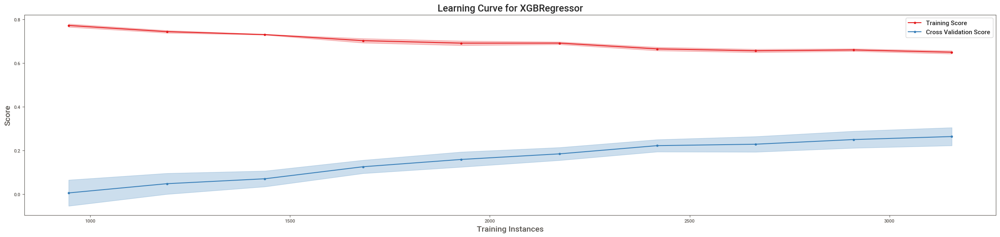

In [ ]:
# PyCaret Low-Code Regressor

# initialize setup
regression = setup(data=df, target='WIND',fold=5,
                   numeric_features=quant_features, normalize=True,
                   feature_selection=True, session_id = 123)

# Compare multiple models and select the best one
best_model = compare_models(sort='MSE')   # run the horse race

# Tune the model using a grid search
tuned_model = tune_model(best_model)  #tune hyperparameters of the best model

# Evaluate the performance of the tuned model
evaluate_model(tuned_model)            # Get KPIs of muned model

# plot learning curve
plot_model(tuned_model, plot='learning')    # Plot the learning curve
%matplotlib inline
plt.show()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extreme Gradient Boosting,3.2534,16.6677,4.0826,0.3228,0.4395,0.5439


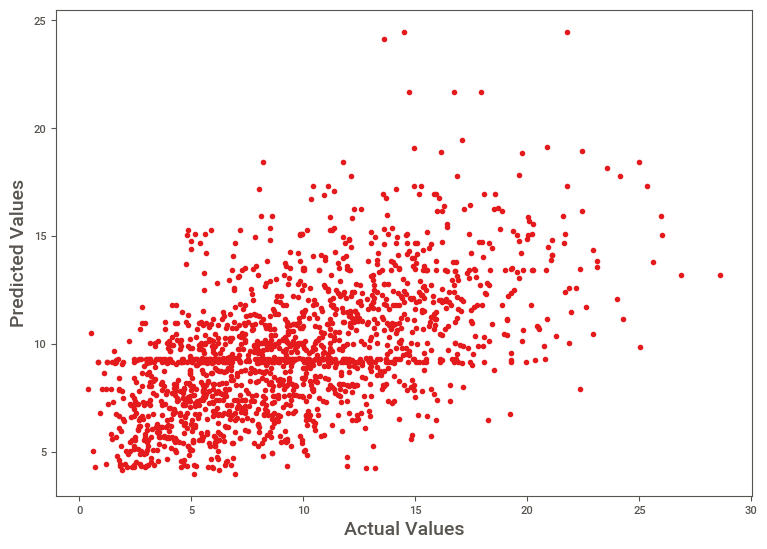

In [ ]:
# Graph actual vs predicted for tuned PyCaret model
# make predictions
predictions = predict_model(tuned_model)

# plot actuals versus predicted values
plt.scatter(predictions['WIND'], predictions['prediction_label'])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

#**Regressor Development**


In [ ]:
# Regressor Development and Assessment

names = ['Multiple Linear Regression', 'Lasso Regression', 'Ridge Regression','ElasticNet Regression','kNN', 'SVM','Decision Tree', 'Multilayer Perceptron','Random Forest', 'XGBoost', 'AdaBoost','LightGBM']
regressors = [linear_model.LinearRegression(),
              Lasso(alpha=0.5),
              Ridge(alpha=0.5),
              ElasticNet(alpha=0.25, l1_ratio=0.5),
              KNeighborsRegressor(n_neighbors=5),
              SVR(kernel = 'poly'),   #Can try kernels 'poly', 'linear', 'rbf' and 'sigmoid' kernels
              DecisionTreeRegressor(),
              MLPRegressor(hidden_layer_sizes=(25,25,1),
                       max_iter = 1000,activation = 'relu',
                       solver = 'adam'),
              RandomForestRegressor(criterion='squared_error'),
              XGBRegressor(objective ='reg:squarederror'),
              AdaBoostRegressor(loss='square'),
              lgb.LGBMRegressor(objective='mean_squared_error')
              ]

for name, regr in zip(names, regressors):
  print('REGRESSOR: ',name)
  pipe = Pipeline(steps=[('normalize', MinMaxScaler()), ('model', regr)])
  model = TransformedTargetRegressor(regressor=pipe, transformer=MinMaxScaler())
  cv = KFold(n_splits=10, shuffle=True, random_state=1)
  scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=cv, n_jobs=-1)
  score_mean = mean(absolute(scores))
  score_stdev = np.std(scores)
  print('Mean (std Dev) of MSE: %.3f (%.3f)\n' % (score_mean, score_stdev))

REGRESSOR:  Multiple Linear Regression
Mean (std Dev) of MSE: 20.133 (1.375)

REGRESSOR:  Lasso Regression
Mean (std Dev) of MSE: 24.387 (1.709)

REGRESSOR:  Ridge Regression
Mean (std Dev) of MSE: 20.131 (1.379)

REGRESSOR:  ElasticNet Regression
Mean (std Dev) of MSE: 24.387 (1.709)

REGRESSOR:  kNN
Mean (std Dev) of MSE: 20.284 (1.598)

REGRESSOR:  SVM
Mean (std Dev) of MSE: 19.334 (1.658)

REGRESSOR:  Decision Tree
Mean (std Dev) of MSE: 34.022 (2.216)

REGRESSOR:  Multilayer Perceptron
Mean (std Dev) of MSE: 22.464 (2.863)

REGRESSOR:  Random Forest
Mean (std Dev) of MSE: 17.377 (1.028)

REGRESSOR:  XGBoost
Mean (std Dev) of MSE: 16.938 (1.007)

REGRESSOR:  AdaBoost
Mean (std Dev) of MSE: 25.348 (1.013)

REGRESSOR:  LightGBM
Mean (std Dev) of MSE: 16.744 (0.973)



#**XGBoost Regression**


,Description,Value
0,Session id,123
1,Target,WIND
2,Target type,Regression
3,Original data shape,"(6574, 11)"
4,Transformed data shape,"(6574, 3)"
5,Transformed train set shape,"(4601, 3)"
6,Transformed test set shape,"(1973, 3)"
7,Numeric features,7
8,Rows with missing values,14.2%
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.9050,24.1098,4.9102,0.0172,0.5021,0.5998
1,4.0867,26.2315,5.1217,-0.0644,0.5364,0.7029
2,3.8843,23.5280,4.8506,0.0242,0.4967,0.6469
3,3.9657,25.1576,5.0157,-0.0303,0.5009,0.6047
4,4.0312,25.7398,5.0734,-0.0268,0.5208,0.6905
Mean,3.9746,24.9534,4.9943,-0.0160,0.5114,0.6490
Std,0.0760,1.0037,0.1007,0.0328,0.0150,0.0425


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.6704,21.4105,4.6272,0.1273,0.4835,0.5900
1,3.7168,21.3766,4.6235,0.1326,0.4961,0.6544
2,3.6646,20.9822,4.5806,0.1298,0.4771,0.6288
3,3.6478,21.5671,4.6440,0.1167,0.4733,0.5755
4,3.6903,21.8139,4.6705,0.1298,0.4868,0.6496
Mean,3.6780,21.4301,4.6292,0.1273,0.4834,0.6197
Std,0.0237,0.2720,0.0294,0.0055,0.0080,0.0317


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 5 folds for each of 10 candidates, totalling 50 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

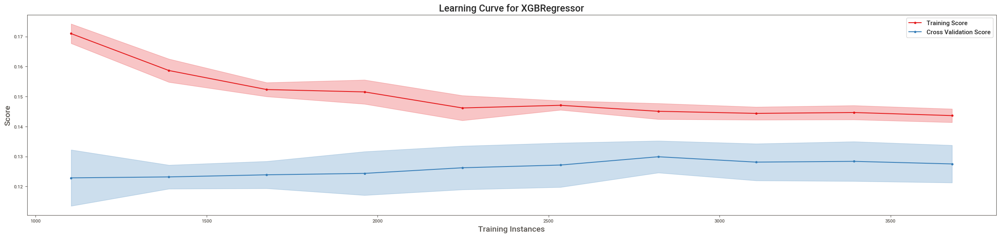

In [ ]:
import pandas as pd
from pycaret.regression import *


# Update the quant_features list
quant_features = ['IND', 'RAIN', 'IND.1', 'T.MAX', 'IND.2', 'T.MIN', 'T.MIN.G']

# Initialize setup
regression = setup(data=df, target='WIND', fold=5,
                   numeric_features=quant_features, normalize=True,
                   feature_selection=True, session_id=123)

# Create XGBoost regression model
xgboost_model = create_model('xgboost')

# Tune the model using a grid search
tuned_xgboost_model = tune_model(xgboost_model)

# Evaluate the performance of the tuned model
evaluate_model(tuned_xgboost_model)

# Plot learning curve
plot_model(tuned_xgboost_model, plot='learning')

# Display the plot
%matplotlib inline
plt.show()


#**Light BGM Regression with grid search**

In [ ]:
print(df.columns)


Index(['DATE', 'WIND', 'IND', 'RAIN', 'IND.1', 'T.MAX', 'IND.2', 'T.MIN',
       'T.MIN.G'],
      dtype='object')


In [ ]:
!pip install --upgrade matplotlib
!pip install --upgrade dtreeviz


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.5/91.5 kB 5.6 MB/s eta 0:00:00


In [ ]:
import pycaret
import matplotlib
import dtreeviz

print("PyCaret version:", pycaret.__version__)
print("Matplotlib version:", matplotlib.__version__)
print("DTreeViz version:", dtreeviz.__version__)

PyCaret version: 3.0.0
Matplotlib version: 3.7.1
DTreeViz version: 2.2.1


Index(['WIND', 'IND', 'RAIN', 'IND.1', 'T.MAX', 'IND.2', 'T.MIN', 'T.MIN.G',
       'Year', 'Month', 'Day'],
      dtype='object')


,Description,Value
0,Session id,123
1,Target,WIND
2,Target type,Regression
3,Original data shape,"(6574, 11)"
4,Transformed data shape,"(6574, 3)"
5,Transformed train set shape,"(4601, 3)"
6,Transformed test set shape,"(1973, 3)"
7,Numeric features,7
8,Rows with missing values,14.2%
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.7881,22.7195,4.7665,0.0739,0.4897,0.5907
1,3.8935,23.4206,4.8395,0.0497,0.5148,0.6821
2,3.7004,21.2495,4.6097,0.1187,0.4744,0.6219
3,3.7466,22.4150,4.7345,0.0820,0.4791,0.5836
4,3.7777,22.7461,4.7693,0.0926,0.4923,0.6481
Mean,3.7813,22.5102,4.7439,0.0834,0.4901,0.6253
Std,0.0639,0.7109,0.0753,0.0227,0.0140,0.0366


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.6967,21.5127,4.6382,0.1231,0.4820,0.5875
1,3.7543,21.4967,4.6365,0.1277,0.4992,0.6645
2,3.6456,20.6760,4.5471,0.1425,0.4722,0.6209
3,3.6248,21.1752,4.6016,0.1328,0.4692,0.5697
4,3.6711,21.6531,4.6533,0.1362,0.4864,0.6478
Mean,3.6785,21.3027,4.6153,0.1325,0.4818,0.6181
Std,0.0450,0.3503,0.0381,0.0067,0.0107,0.0355


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 5 folds for each of 10 candidates, totalling 50 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

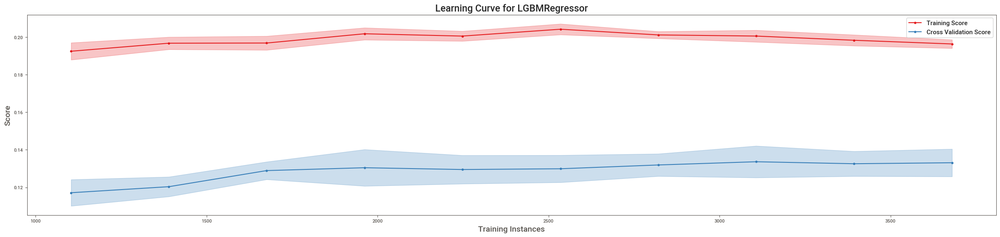

In [ ]:
# Import required libraries
import pandas as pd
from pycaret.regression import *

# Print DataFrame columns
print(df.columns)

# Update the quant_features list
quant_features = ['IND', 'RAIN', 'IND.1', 'T.MAX', 'IND.2', 'T.MIN', 'T.MIN.G']

# Initialize setup
regression = setup(data=df, target='WIND', fold=5,
                   numeric_features=quant_features, normalize=True,
                   feature_selection=True, session_id=123)

# Create LightGBM regression model
lightgbm_model = create_model('lightgbm')

# Tune the model using a grid search
tuned_lightgbm_model = tune_model(lightgbm_model)

# Evaluate the performance of the tuned model
evaluate_model(tuned_lightgbm_model)

# Plot learning curve
plot_model(tuned_lightgbm_model, plot='learning')

# Display the plot
%matplotlib inline
plt.show()


In [ ]:
import pandas as pd
from sklearn.model_selection import GridSearchCV, train_test_split
from lightgbm import LGBMRegressor

# Load dataset
#df = pd.read_csv("your_dataset.csv")

# Split data into features and target
X = df.drop("WIND", axis=1)
y = df["WIND"]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the LightGBM regressor
lgbm = LGBMRegressor()

# Define the parameter grid to search
params = {'learning_rate': [0.05, 0.1, 0.2],
          'max_depth': [3, 5, 7],
          'n_estimators': [50, 100, 200]}

# Create a grid search object
cv = GridSearchCV(lgbm, params, cv=5)

# Fit the grid search object to the data
cv.fit(X_train, y_train)

# Print the best parameters and best score
print(f"Best Parameters: {cv.best_params_}")
print(f"Best Score: {cv.best_score_}")


Best Parameters: {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 200}
Best Score: 0.282956990969513


#**Random Forest Regression**

,Description,Value
0,Session id,123
1,Target,WIND
2,Target type,Regression
3,Original data shape,"(6574, 11)"
4,Transformed data shape,"(6574, 3)"
5,Transformed train set shape,"(4601, 3)"
6,Transformed test set shape,"(1973, 3)"
7,Numeric features,7
8,Rows with missing values,14.2%
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4.0343,25.8344,5.0828,-0.0531,0.5176,0.6180
1,4.2696,28.9172,5.3775,-0.1734,0.5521,0.7149
2,4.0316,25.1725,5.0172,-0.0440,0.5101,0.6573
3,4.0957,26.5289,5.1506,-0.0865,0.5138,0.6196
4,4.1709,28.0740,5.2985,-0.1199,0.5375,0.7074
Mean,4.1204,26.9054,5.1853,-0.0953,0.5262,0.6634
Std,0.0902,1.3932,0.1339,0.0473,0.0160,0.0415


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.6687,21.1758,4.6017,0.1368,0.4809,0.5882
1,3.7051,21.1810,4.6023,0.1405,0.4974,0.6619
2,3.6246,20.4835,4.5259,0.1505,0.4715,0.6221
3,3.6301,21.3210,4.6175,0.1268,0.4710,0.5720
4,3.6580,21.4140,4.6275,0.1458,0.4839,0.6445
Mean,3.6573,21.1151,4.5950,0.1401,0.4809,0.6177
Std,0.0291,0.3282,0.0359,0.0081,0.0097,0.0336


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 5 folds for each of 10 candidates, totalling 50 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

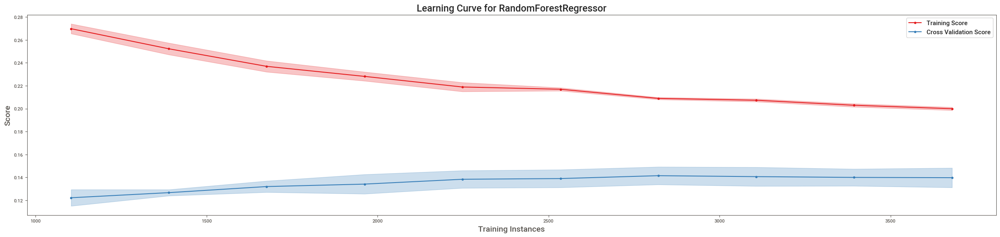

In [ ]:
# Import necessary libraries
import pandas as pd
from pycaret.regression import *

# Load your dataset
# df = pd.read_csv('your_data_file.csv')

# Initialize the PyCaret setup
regression_setup = setup(data=df, target='WIND', fold=5,
                         numeric_features=quant_features, normalize=True,
                         feature_selection=True, session_id=123)

# Create the Random Forest regressor
rf_model = create_model('rf')  # 'rf' stands for Random Forest

# Hyperparameter tuning (optional)
tuned_rf = tune_model(rf_model)

# Evaluate the performance of the tuned model
evaluate_model(tuned_rf)

# Plot the learning curve (optional)
plot_model(tuned_rf, plot='learning')
%matplotlib inline
plt.show()

#**AUC Values**

In [ ]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

# Generate a sample dataset
X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, random_state=42)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the classifiers
lgbm_classifier = LGBMClassifier()
lgbm_classifier.fit(X_train, y_train)

xgb_classifier = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_classifier.fit(X_train, y_train)

rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)

# Predict probabilities
lgbm_probs = lgbm_classifier.predict_proba(X_test)[:, 1]
xgb_probs = xgb_classifier.predict_proba(X_test)[:, 1]
rf_probs = rf_classifier.predict_proba(X_test)[:, 1]

# Calculate AUC
lgbm_auc = roc_auc_score(y_test, lgbm_probs)
xgb_auc = roc_auc_score(y_test, xgb_probs)
rf_auc = roc_auc_score(y_test, rf_probs)

print(f"LightGBM AUC: {lgbm_auc:.4f}")
print(f"XGBoost AUC: {xgb_auc:.4f}")
print(f"Random Forest AUC: {rf_auc:.4f}")


LightGBM AUC: 0.9480
XGBoost AUC: 0.9499
Random Forest AUC: 0.9343


#**Sample Actual vs Predicted Graph for Light BGM**


R-squared score: 0.2768760158761302


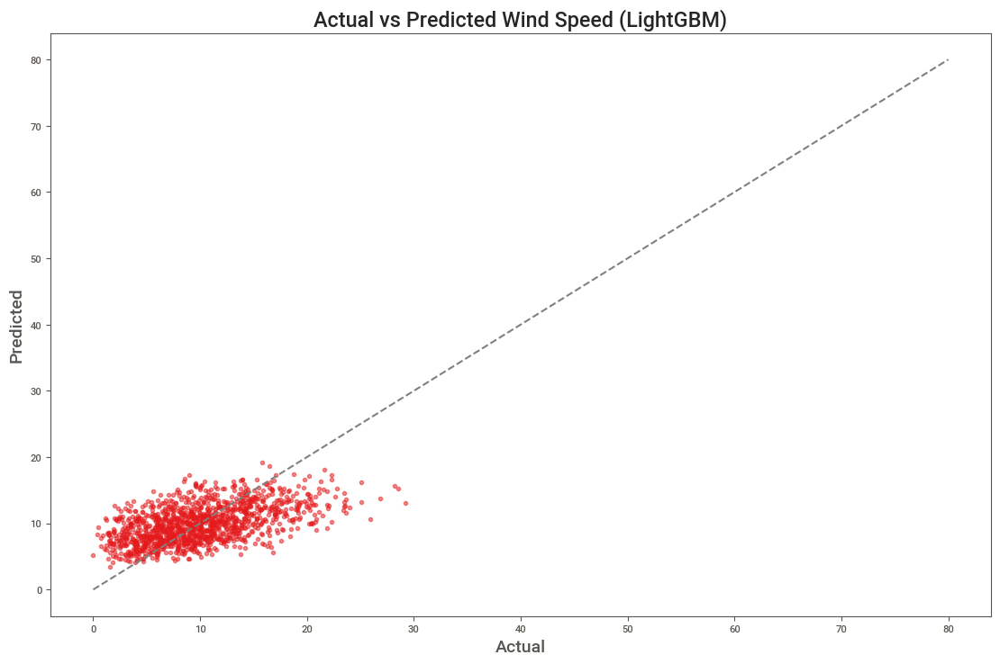

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split



# Split data into features and target
X = df.drop("WIND", axis=1)
y = df["WIND"]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the LightGBM regressor with best parameters
lgbm = LGBMRegressor(learning_rate=0.05, max_depth=7, n_estimators=200)

# Fit the regressor to the training data
lgbm.fit(X_train, y_train)

# Predict the target values for the test set
y_pred = lgbm.predict(X_test)

# Compute the R-squared score on the test set
r2 = r2_score(y_test, y_pred)
print(f"R-squared score: {r2}")

# Plot actual vs predicted values
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot(np.linspace(0, 80, 100), np.linspace(0, 80, 100), '--', color='gray')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted Wind Speed (LightGBM)")
plt.show()


#**Learning Curves (With Cross Validation) for XGBoost , Light BGM , Random Forest Regressions**

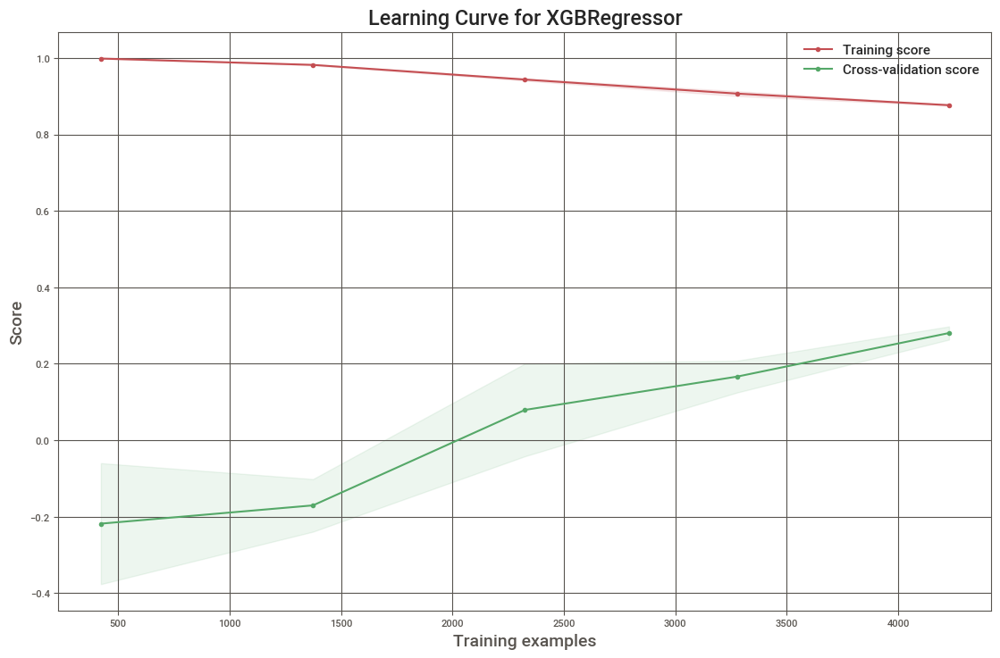

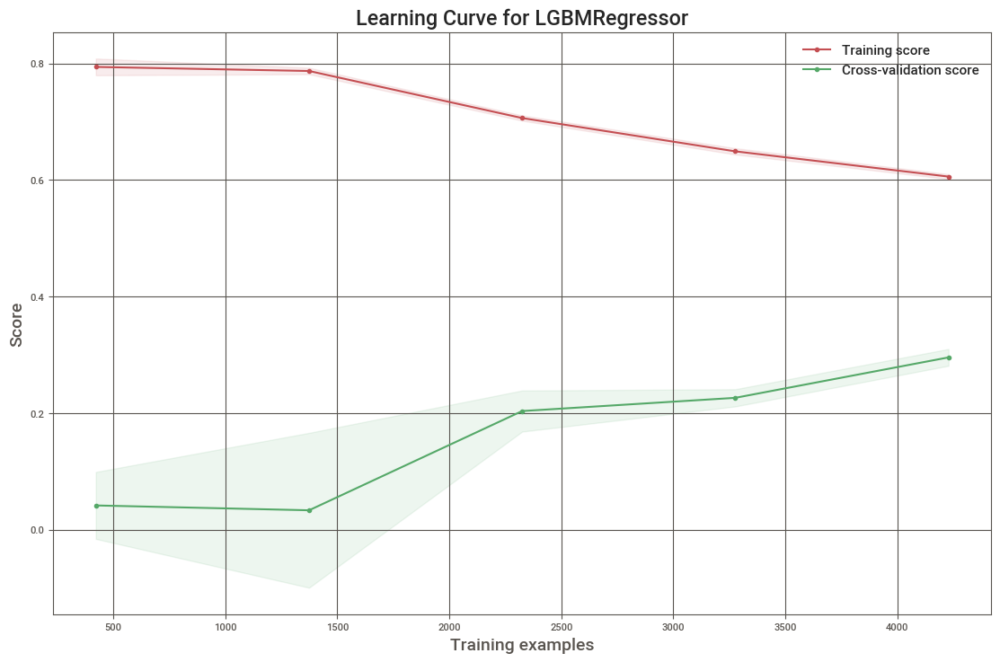

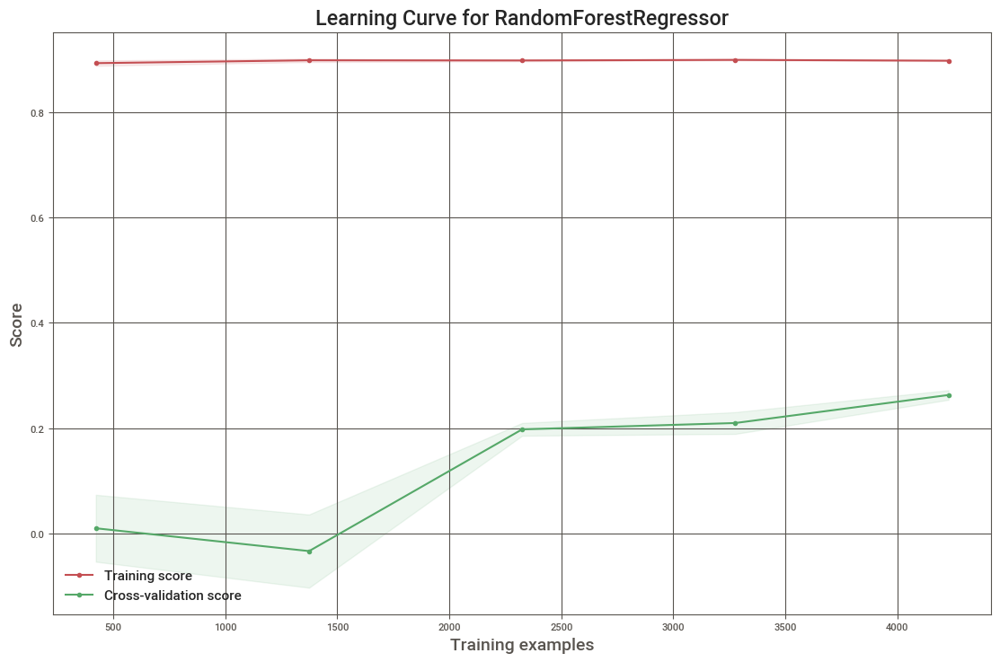

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold, learning_curve

# Load your dataset
# X, y = your_data()

# Create models
xgb_model = XGBRegressor(objective='reg:squarederror')
lgbm_model = LGBMRegressor()
rf_model = RandomForestRegressor()

# Cross-validation setup
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=192837465)

# Plot learning curve
def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.legend(loc="best")
    plt.show()

# Plot learning curves for XGBoost, LightGBM, and Random Forest regressions
plot_learning_curve(xgb_model, "Learning Curve for XGBRegressor", X, y, cv=cv)
plot_learning_curve(lgbm_model, "Learning Curve for LGBMRegressor", X, y, cv=cv)
plot_learning_curve(rf_model, "Learning Curve for RandomForestRegressor", X, y, cv=cv)


#**Conclusion**
LightGBM is the best fitted regression model with Mean (std Dev) of MSE of 16.744 (0.973) and AUC of 0.9480